In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import scipy.stats as st

import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go

from wordcloud import WordCloud, STOPWORDS

from scipy.stats import chisquare, kstest

from pandas_profiling import ProfileReport

### Read Beer Reviews Data

In [2]:
data = pd.read_csv('BeerDataScienceProject.csv', encoding='latin-1')

#### extract year, month, hour to validate any relationships

In [3]:
data['review_time'] = pd.to_datetime(data['review_time'], unit='s')
data['review_year'] = data['review_time'].dt.year
data['review_month'] = data['review_time'].dt.month
data['review_hr'] = data['review_time'].dt.hour
data.sample(5)

,beer_ABV,beer_beerId,beer_brewerId,beer_name,beer_style,review_appearance,review_palette,review_overall,review_taste,review_profileName,review_aroma,review_text,review_time,review_year,review_month,review_hr
391800,5.1,46955,3,Satsuma Harvest Wit,Witbier,3.0,3.5,3.5,3.5,u2carew,3.5,12oz bottle consumed on 9/26/09 A) Pours with ...,2009-09-27 17:47:44,2009,9,17
397274,NaN,75432,25259,Ode To A Russian Shipwright,American Porter,4.0,4.0,4.0,4.0,zeff80,4.5,Bottle purchased at Zipp's on 12/23. Consumed ...,2012-01-06 03:16:22,2012,1,3
423920,8.0,7728,697,Hitachino Nest Extra High (XH),Belgian Strong Dark Ale,4.0,4.5,3.5,3.5,ojiikun,3.5,Poured from the stubby bottle pictured into a ...,2008-01-28 04:33:00,2008,1,4
228033,10.0,17060,158,Hercules Double IPA,American Double / Imperial IPA,4.5,4.5,4.0,4.5,oberon,4.5,"Thanks to hoppedup for the bottle,pours a slig...",2005-07-02 23:51:57,2005,7,23
54142,5.0,246,81,Heineken Lager Beer,Euro Pale Lager,2.5,3.5,4.5,3.5,yunggunn2k1,3.0,A= Pale yellow with a small head that settles ...,2008-06-11 05:33:22,2008,6,5


## Pandas Profiling

In [4]:
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
profile.to_file("pandas_profiling.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Important findings to note from pandas profiling

- Review data is from 1998-2012, most of reviews are from 2011. Some beers were reviewed only in specific year
- All review rating items are highly correlated with each other --> review_appearance, review_palette, review_taste, review_appearance, review_aroma, review_overall
- beer_ABV has 3.8% of missing values
- beer_ABV has mean=7, median=6.5 and SD=2.2 and some outliers like 57.7
- Some beers and brewers are more frequently reviewed than others.

### Fun Facts 
- reviews are written in typical drinking hours - evening to early morning, especially past midnight

## Duplicate Reviews

In [6]:
duplicate = data[data.duplicated(['beer_beerId', 'beer_brewerId', 'review_profileName'], keep='last')]
print(duplicate.shape)

(4777, 16)


In [7]:
### 9400 rows are duplicate reviews, this will skew our analysis. Keeping them aside

data.drop_duplicates(subset=['beer_beerId', 'beer_brewerId', 'review_profileName'], keep='last', inplace=True)

## Missing Values

In [8]:
# alcohol by volume has lot of missing values, profile name and review text has few missing values
data.isna().sum()/len(data) * 100

beer_ABV              3.848172
beer_beerId           0.000000
beer_brewerId         0.000000
beer_name             0.000000
beer_style            0.000000
review_appearance     0.000000
review_palette        0.000000
review_overall        0.000000
review_taste          0.000000
review_profileName    0.020989
review_aroma          0.000000
review_text           0.022515
review_time           0.000000
review_year           0.000000
review_month          0.000000
review_hr             0.000000
dtype: float64

In [9]:
data_abv_missing = data[(data['beer_ABV'].isna()) & (data['review_text'].isna())]
data_abv_missing

data[data['review_text'].isnull()].index.tolist()

[3706,
 5375,
 14804,
 17009,
 17568,
 18079,
 21070,
 23949,
 24849,
 28402,
 31971,
 33608,
 33655,
 40466,
 44000,
 45829,
 46890,
 54700,
 61166,
 79417,
 85704,
 86649,
 91558,
 93914,
 99922,
 106342,
 109756,
 118382,
 125153,
 125891,
 127215,
 150356,
 151489,
 152454,
 153680,
 161943,
 168358,
 178299,
 194171,
 199907,
 207258,
 214009,
 225736,
 232156,
 233602,
 234843,
 236039,
 242709,
 243415,
 246094,
 248318,
 255600,
 257591,
 264636,
 266287,
 267517,
 272633,
 280663,
 284341,
 284811,
 289066,
 289380,
 292096,
 292134,
 323034,
 330361,
 331912,
 344374,
 363545,
 364270,
 364774,
 368047,
 368187,
 369397,
 370275,
 371771,
 372882,
 373324,
 374208,
 380170,
 380793,
 384610,
 385435,
 385456,
 410669,
 412623,
 416736,
 421229,
 423382,
 424226,
 425443,
 436020,
 443683,
 460944,
 465375,
 466853,
 467849,
 470244,
 472237,
 478543,
 487900,
 488408,
 488941,
 492270,
 497059,
 499740,
 505231,
 505235,
 508766,
 516035,
 520872,
 521081,
 521621,
 523535,
 

## Question 1 : Rank top 3 Breweries which produce the strongest beers ?

In [10]:
### ABV - Alcohol by Volume being representation of beer's strongness

- 1607 unique breweries, which have ABV data
- Extreme values at both end, overall data can be considered normal distribution for given kurtosis < 7 and skeness < 2


- Minimum	0.01
- 5-th percentile	4.5
- Q1	5.3
- median	6.5
- Q3	8.5
- 95-th percentile	11
- Maximum	57.7

In [11]:
# get 0.01 %le and 99.99 %le

df = data.dropna(axis=0, subset=['beer_ABV'])
print(df.groupby('beer_brewerId')['beer_ABV'].quantile([.01, .25, .5, .75, .99]).unstack())

df_by_brewerId = df.groupby('beer_brewerId')['beer_ABV'].agg(['count', 'mean', 'median'])
print("Strongest breweries by ABV mean : \n", df_by_brewerId.sort_values(by='mean',ascending=False).head(5))
print("\nStrongest breweries by ABV median : \n", df_by_brewerId.sort_values(by='median',ascending=False).head(5))

                0.01   0.25  0.50   0.75    0.99
beer_brewerId                                   
1              4.100  4.400  4.40  4.400   5.240
3              4.000  4.500  5.40  6.500   8.000
5              4.000  4.200  4.70  5.200   6.000
10             4.275  5.000  5.00  5.000   5.000
14             4.000  5.000  6.10  8.600  12.600
...              ...    ...   ...    ...     ...
27870          5.515  5.875  6.00  6.125   6.485
27879          5.500  5.500  5.50  5.500   5.500
27917          8.000  8.000  8.00  8.000   8.000
27922          4.951  6.175  7.45  8.725   9.949
27980          3.824  4.400  5.00  5.100   5.196

[1607 rows x 5 columns]
Strongest breweries by ABV mean : 
                count       mean  median
beer_brewerId                          
6513              34  19.228824    13.0
736               18  13.750000    14.0
24215              3  12.466667    11.0
36               314  12.445860    13.0
8540               4  11.750000    12.0

Strongest breweries b

In [12]:
df_row_count_by_breweries = df.groupby('beer_brewerId')['beer_brewerId'].count()
print("Mean number of rows for each brewer :", df_row_count_by_breweries.mean())

print("Quantiles, no. of beers for each brewer :", np.quantile(df_row_count_by_breweries.values, [.01, .25, .5, .6, .75, .99]))

# Median number of beers produced by each brewry is 5
print(".01, .25, .5, .75, .99 quantiles : No. of beers produced by brewery")
df_unique_beers_by_breweries = df.groupby(['beer_brewerId'])['beer_beerId'].nunique().sort_values(ascending=False)
np.quantile(df_unique_beers_by_breweries.values, [.01, .25, .5, .75, .99])

Mean number of rows for each brewer : 313.5812072184194
Quantiles, no. of beers for each brewer : [1.0000e+00 3.0000e+00 1.3000e+01 2.3000e+01 6.9000e+01 7.0545e+03]
.01, .25, .5, .75, .99 quantiles : No. of beers produced by brewery


array([ 1.  ,  2.  ,  5.  , 10.  , 70.94])

In [13]:
# Take top 5 from each category and see their range variation w.r.t ABV

# ignoring 24215, 8540 since we have only 3 and 4 rows respectively for them.

df[df['beer_brewerId'].isin([6513, 736, 36, 5562, 2830])].groupby('beer_brewerId')['beer_ABV'].quantile([.01, .25, .5, .75, .99]).unstack()

,0.01,0.25,0.50,0.75,0.99
beer_brewerId,,,,,
36,6.400,13.0,13.0,13.0,13.000
736,12.500,14.0,14.0,14.0,14.000
2830,3.900,4.6,12.0,12.0,14.000
5562,4.500,4.8,13.2,13.2,13.200
6513,7.573,13.0,13.0,16.0,52.849


#### Taking only rows with atleast 13 samples for a given brewer and atleast producing 5 different bear categories

In [14]:
# Filter brewers with atleast 13 rows in data
vc = df['beer_brewerId'].value_counts()
df_ge_13_rows_brewer = df[df['beer_brewerId'].isin(vc[vc >= 13].index)]

# Filter further those brewers which produce atleast 5 different bear categories
vc = df_ge_13_rows_brewer.groupby(['beer_brewerId'])['beer_beerId'].nunique()
df_ge_13_rows_brewer_ge_5_beers = df_ge_13_rows_brewer[df_ge_13_rows_brewer['beer_brewerId'].isin(vc[vc >= 5].index)]

In [15]:
df_by_brewerId = df_ge_13_rows_brewer_ge_5_beers.groupby('beer_brewerId')['beer_ABV'].agg(['count', 'mean', 'median'])
print("Strongest breweries by ABV mean : \n", df_by_brewerId.sort_values(by='mean',ascending=False).head(5))
print("\nStrongest breweries by ABV median : \n", df_by_brewerId.sort_values(by='median',ascending=False).head(5))

Strongest breweries by ABV mean : 
                count       mean  median
beer_brewerId                          
6513              34  19.228824   13.00
36               314  12.445860   13.00
3704              30  10.203333   10.00
2796             143  10.048252    9.80
7848              80   9.693750    9.25

Strongest breweries by ABV median : 
                count       mean  median
beer_brewerId                          
6513              34  19.228824   13.00
36               314  12.445860   13.00
2830             148   8.851622   12.00
2958             699   9.185308   10.28
3704              30  10.203333   10.00


In [16]:
#### Taking only rows with atleast 30 samples (using statistical significance here) for a given brewer and atleast producing 5 different bear categories

# Filter brewers with atleast 30 rows in data, No difference from above result
vc = df['beer_brewerId'].value_counts()
df_ge_30_rows_brewer = df[df['beer_brewerId'].isin(vc[vc >= 30].index)]

# Filter further those brewers which produce atleast 5 different bear categories
vc = df_ge_30_rows_brewer.groupby(['beer_brewerId'])['beer_beerId'].nunique()
df_ge_30_rows_brewer_ge_5_beers = df_ge_30_rows_brewer[df_ge_30_rows_brewer['beer_brewerId'].isin(vc[vc >= 5].index)]


df_by_brewerId = df_ge_30_rows_brewer_ge_5_beers.groupby('beer_brewerId')['beer_ABV'].agg(['count', 'mean', 'median'])
print("Strongest breweries by ABV mean : \n", df_by_brewerId.sort_values(by='mean',ascending=False).head(5))
print("\nStrongest breweries by ABV median : \n", df_by_brewerId.sort_values(by='median',ascending=False).head(5))

Strongest breweries by ABV mean : 
                count       mean  median
beer_brewerId                          
6513              34  19.228824   13.00
36               314  12.445860   13.00
3704              30  10.203333   10.00
2796             143  10.048252    9.80
7848              80   9.693750    9.25

Strongest breweries by ABV median : 
                count       mean  median
beer_brewerId                          
36               314  12.445860   13.00
6513              34  19.228824   13.00
2830             148   8.851622   12.00
2958             699   9.185308   10.28
396             6232   9.387827   10.00


#### Top 3 brewers -
### Final Answer - 36 and 6513  are undoubtly top two, for third the choice is 2796 

- 736 is excluded because we only have very little info available 4 types of bear produced by it
- 6513 is the company producing beers with ABV as high as 57, 39 (quite an outlier)
- 36 consistently came at higher ABV by filtering across different criteria, and has 314 rows in support.. So going with it.

- Not a clear winner, but choosing 2796 over 2830 reasons - mean of 2830 is on lower side


## Question 2 : Which year did beers enjoy the highest ratings ?

### Answer : 2010
#### Calculate 95% CI to prove !

In [17]:
# considering rating is affected by only rating related columns, let's take a subset of data to work with

df_rating = data[['beer_ABV', 'beer_beerId', 'beer_brewerId', 'review_appearance', 'review_palette', 'review_taste', 'review_aroma', 'review_overall', 'review_text', 'review_year']]
df_rating_yearly = df_rating.groupby(['review_year'])['review_overall','review_palette','review_taste', 'review_aroma'].mean().round(1).sort_values(by='review_aroma',ascending=False)
df_rating_yearly = df_rating_yearly.reset_index(level=0)
df_rating_yearly

/var/folders/ms/6c8dhkpn3_56dndmwqvp274r0000gn/T/ipykernel_96002/236477789.py:4: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_rating_yearly = df_rating.groupby(['review_year'])['review_overall','review_palette','review_taste', 'review_aroma'].mean().round(1).sort_values(by='review_aroma',ascending=False)


,review_year,review_overall,review_palette,review_taste,review_aroma
0,2000,4.2,3.9,4.0,4.2
1,1998,3.9,3.6,3.7,4.0
2,1999,4.0,3.8,3.8,4.0
3,2001,3.9,3.7,3.8,3.9
4,2002,3.8,3.7,3.7,3.8
5,2004,3.8,3.7,3.7,3.8
6,2005,3.8,3.7,3.7,3.8
7,2006,3.8,3.7,3.7,3.8
8,2007,3.8,3.7,3.7,3.8
9,2008,3.8,3.8,3.8,3.8


### Chi Sqaure test for normality test, all rating variables are normal distributions

In [18]:
stat, p = chisquare(df_rating_yearly['review_overall'])
print("review_overall", "statistic=%.3f, p=%.3f"%(stat,p))

stat, p = chisquare(df_rating_yearly['review_palette'])
print("review_palette", "statistic=%.3f, p=%.3f"%(stat,p))

stat, p = chisquare(df_rating_yearly['review_taste'])
print("review_taste", "statistic=%.3f, p=%.3f"%(stat,p))

stat, p = chisquare(df_rating_yearly['review_aroma'])
print("review_aroma", "statistic=%.3f, p=%.3f"%(stat,p))

review_overall statistic=0.045, p=1.000
review_palette statistic=0.026, p=1.000
review_taste statistic=0.025, p=1.000
review_aroma statistic=0.056, p=1.000


In [19]:
# count number of rows for each year
df_rating.groupby(['review_year'])['review_overall'].count()

review_year
1998        23
1999        25
2000        33
2001       599
2002      7505
2003     17936
2004     22655
2005     29143
2006     42714
2007     46105
2008     68479
2009     82822
2010     92895
2011    110001
2012      3158
Name: review_overall, dtype: int64

## Question 3 : Based on the user’s ratings which factors are important among taste, aroma, appearance, and palette?

### Ans : review_aroma

- aroma is highly correlated to overall review score
- Even with feature importance of fitment in regression, it scores way ahead
- taste and pallette itself are correlated to aroma

In [20]:
#### Let's get correlation plot

df_user_rating = data[['beer_ABV', 'beer_beerId', 'beer_brewerId', 'review_appearance', 'review_palette', 'review_taste', 'review_aroma', 'review_overall', 'review_text']]

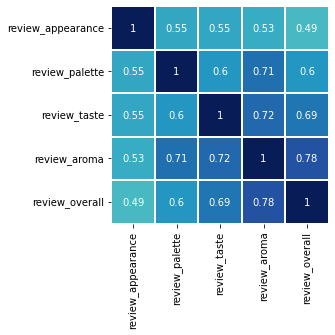

In [21]:
corr = df_user_rating[['review_appearance', 'review_palette', 'review_taste', 'review_aroma', 'review_overall']].corr()

ax1 = sns.heatmap(corr, cbar=0, linewidths=2, vmax=1, vmin=0, square=True, cmap="YlGnBu", annot=True)
plt.show()

In [22]:
from sklearn.ensemble import RandomForestRegressor

X = df_user_rating[['review_appearance', 'review_palette', 'review_taste', 'review_aroma']]
y = df_user_rating['review_overall']
rf = RandomForestRegressor(random_state=0)
rf.fit(X, y)
RandomForestRegressor(...)

RandomForestRegressor(n_estimators=Ellipsis)

<BarContainer object of 4 artists>

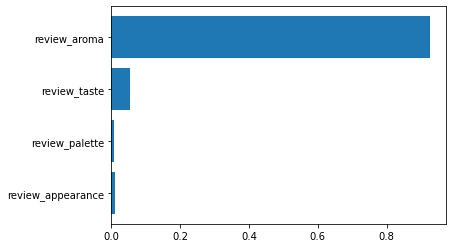

In [23]:
#review aroma seems to be more important
plt.barh(['review_appearance', 'review_palette', 'review_taste', 'review_aroma'], rf.feature_importances_)

In [24]:
pio.templates.default = "plotly_white"

corr = df_user_rating.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

go.Heatmap(
    z=corr.mask(mask),
    x=corr.columns,
    y=corr.columns,
    colorscale=px.colors.diverging.RdBu,
    zmin=-1,
    zmax=1
)


Heatmap({
    'colorscale': [[0.0, 'rgb(103,0,31)'], [0.1, 'rgb(178,24,43)'], [0.2,
                   'rgb(214,96,77)'], [0.3, 'rgb(244,165,130)'], [0.4,
                   'rgb(253,219,199)'], [0.5, 'rgb(247,247,247)'], [0.6,
                   'rgb(209,229,240)'], [0.7, 'rgb(146,197,222)'], [0.8,
                   'rgb(67,147,195)'], [0.9, 'rgb(33,102,172)'], [1.0,
                   'rgb(5,48,97)']],
    'x': array(['beer_ABV', 'beer_beerId', 'beer_brewerId', 'review_appearance',
                'review_palette', 'review_taste', 'review_aroma', 'review_overall'],
               dtype=object),
    'y': array(['beer_ABV', 'beer_beerId', 'beer_brewerId', 'review_appearance',
                'review_palette', 'review_taste', 'review_aroma', 'review_overall'],
               dtype=object),
    'z': array([[        nan,         nan,         nan,         nan,         nan,
                         nan,         nan,         nan],
                [ 0.2171627 ,         nan,         nan,     

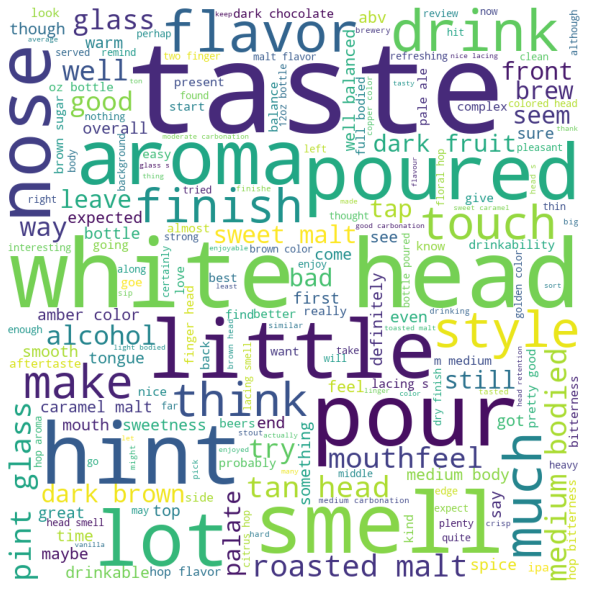

In [25]:
#Ref : https://www.geeksforgeeks.org/generating-word-cloud-python/

comment_words = ''
stopwords = set(STOPWORDS)
stopwords.update(['beer','bit','one'])
 
# iterate through the csv file
for val in df_user_rating.review_text:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

## 4. If you were to recommend 3 beers to your friends based on this data which ones will you recommend ?

In [26]:
#we don't want to recommend beers reviwed very few times
df_by_beerId = df_user_rating.groupby('beer_beerId')['review_overall'].agg(['count', 'mean', 'median'])

print("Top rated beers by mean : \n", df_by_beerId.sort_values(by='mean',ascending=False).head(5))
print("Top beers by median : \n", df_by_beerId.sort_values(by='median',ascending=False).head(5))

Top rated beers by mean : 
              count  mean  median
beer_beerId                     
75310            1   5.0     5.0
30663            1   5.0     5.0
8192             1   5.0     5.0
65556            1   5.0     5.0
37226            1   5.0     5.0
Top beers by median : 
              count  mean  median
beer_beerId                     
50422            1   5.0     5.0
37441            1   5.0     5.0
21907            1   5.0     5.0
66430            1   5.0     5.0
73728            1   5.0     5.0


In [27]:
df_unique_beers_by_breweries = df_user_rating.groupby(['beer_beerId'])['beer_beerId'].count().sort_values(ascending=False)
np.quantile(df_unique_beers_by_breweries.values, [.01, .25, .5, .75, .99])

array([  1.  ,   1.  ,   2.  ,   7.  , 553.03])

In [28]:
# Filter further those beers which have atleast 30 reviews
vc = df_user_rating.groupby(['beer_beerId']).count()
df_ge_30_rows_beer = df_user_rating[df_user_rating['beer_beerId'].isin(vc[vc >= 30].index)]

## Q5 : Which Beer style seems to be the favorite based on reviews written by users?

### Take only beers with atleast 30 rows

In [29]:
df_user_rating_by_beer = df_ge_30_rows_beer.groupby('beer_beerId')['review_overall'].median().sort_values(ascending=False)
df_user_rating_by_beer.head(20)
#sns.relplot(x="review_overall", y="beer_beerId", data=df_user_rating);

beer_beerId
50422    5.0
37441    5.0
21907    5.0
66430    5.0
73728    5.0
50328    5.0
64561    5.0
63460    5.0
73730    5.0
42766    5.0
5321     5.0
47616    5.0
17868    5.0
46643    5.0
2905     5.0
57061    5.0
31085    5.0
25990    5.0
25991    5.0
66421    5.0
Name: review_overall, dtype: float64

### Check how many unique review
- 22800 unique users
- No. of reviews written is normally distributed

### Check top three beers of each user

In [30]:
top_100_reviewers = data.groupby(['review_profileName'])['review_profileName'].count().nlargest(100).index
data_beer = data[data['review_profileName'].isin(top_100_reviewers)]

# group by mean rating by top reviewers
data_beer.groupby(['beer_beerId'])['review_overall'].agg(['count', 'mean', 'median']).sort_values(by='count', ascending=False)

,count,mean,median
beer_beerId,,,
3158,94,4.351064,4.5
2751,94,4.287234,4.5
34,93,4.284946,4.5
1118,93,4.161290,4.0
1904,92,4.288043,4.5
...,...,...,...
37899,1,4.000000,4.0
37895,1,3.500000,3.5
37893,1,3.500000,3.5


In [31]:
data_beer[data_beer['beer_beerId'].isin([3158,2751,34])]['beer_name'].unique()

array(['Hop Rod Rye', 'Racer 5 India Pale Ale', 'La Fin Du Monde'],
      dtype=object)

### Ref :
- https://www.kaggle.com/code/gauravharamkar/beer-data-analysis
- https://www.ahoulette.com/2019/03/11/beer-advocate-reviews
- https://www.kaggle.com/code/gauravharamkar/beer-data-analysis